# Using scAdam for cell type classification

In [2]:
import scanpy as sc
import scparadise
import os
import matplotlib.pyplot as plt 
import numpy as np
import pandas as pd
import warnings 

warnings.simplefilter('ignore')
sc.set_figure_params(dpi = 120)

In [30]:
os.chdir('/mnt/c/Users/vadim/scRNA/scParadise/scripts_package/')

## Recommendations about dataset 
Our models trained using shifted logarithm normalized data. <br>
We recommend shifted logarithm data normalization method to proper usage of our models: <br>
sc.pp.normalize_total(adata, target_sum=None) <br>
sc.pp.log1p(adata) <br>
adata.raw = adata

In [31]:
# Load dataset from 10x Genomics
url = "https://cf.10xgenomics.com/samples/cell-exp/6.1.0/10k_PBMC_3p_nextgem_Chromium_X/10k_PBMC_3p_nextgem_Chromium_X_filtered_feature_bc_matrix.h5"
adata = sc.read_10x_h5("dataset.h5", backup_url = url)
adata.var_names_make_unique()
adata

AnnData object with n_obs × n_vars = 5247 × 33538
    var: 'gene_ids', 'feature_types', 'genome', 'pattern', 'read', 'sequence'

## QC

In [32]:
# mitochondrial genes, "MT-" for human, "Mt-" for mouse
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes
adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]")

In [33]:
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True
)

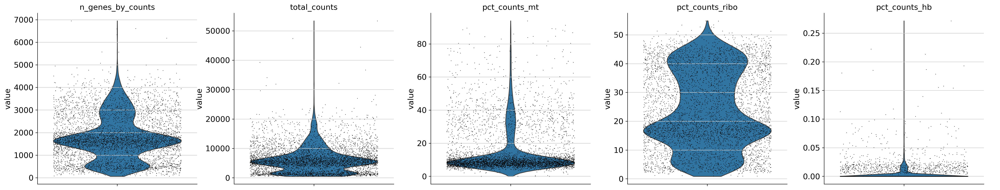

In [34]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt", 'pct_counts_ribo', 'pct_counts_hb'],
    jitter=0.4,
    multi_panel=True,
)

In [35]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

In [36]:
# Detect doublets
sc.pp.scrublet(adata)

In [37]:
# Remove doublets + other QC metrics
adata = adata[adata.obs['predicted_doublet'] == False]
sc.pp.filter_cells(adata, max_genes = 5000)
sc.pp.filter_cells(adata, max_counts = 20000)
adata = adata[adata.obs['pct_counts_mt'] < 15]

## Normalization, HVG, neighbors, PCA, UMAP

In [38]:
# Saving count data
adata.layers["counts"] = adata.X.copy()
# Normalization
sc.pp.normalize_total(adata, target_sum=None)
sc.pp.log1p(adata) 
# scParadise use normalized data in adata.raw!!!
adata.raw = adata
# HVG
sc.pp.highly_variable_genes(adata, n_top_genes=2000)
# PCA
sc.tl.pca(adata)
# Nearest neighbors analysis
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=20)
# UMAP
sc.tl.umap(adata)

## scParadise prediction (scAdam)

In [3]:
# Available models for cell type annotation
scparadise.scadam.available_models()

,Tissue/Model name,Description,Suspension,Accuracy,Balanced Accuracy,Number of Levels
0,Human_PBMC,Peripheral blood mononuclear cells of healthy ...,cells,0.979,0.979,3
1,Human_BMMC,Bone marrow mononuclear cell of healthy adults,cells,0.947,0.942,3
2,Human_Lung,Core Human Lung Cell Atlas,cells,0.965,0.964,5
3,Human_Retina,Single cell atlas of the human retina,cells,0.984,0.979,4
4,Mouse_Retina,Single cell atlas of the mouse retina,cells,0.967,0.960,4


In [40]:
# Download model for cell type prediction
scparadise.scadam.download_model('Human_PBMC', save_path='')

In [41]:
# Predict cell types using trained model
adata = scparadise.scadam.predict(adata, 
                                  path_model = 'Human_PBMC_scAdam/')

Successfully loaded list of genes used for training model

Successfully loaded dictionary of dataset annotations

Successfully loaded model

Successfully added predicted celltype_l1 and cell type probabilities
Successfully added predicted celltype_l2 and cell type probabilities
Successfully added predicted celltype_l3 and cell type probabilities


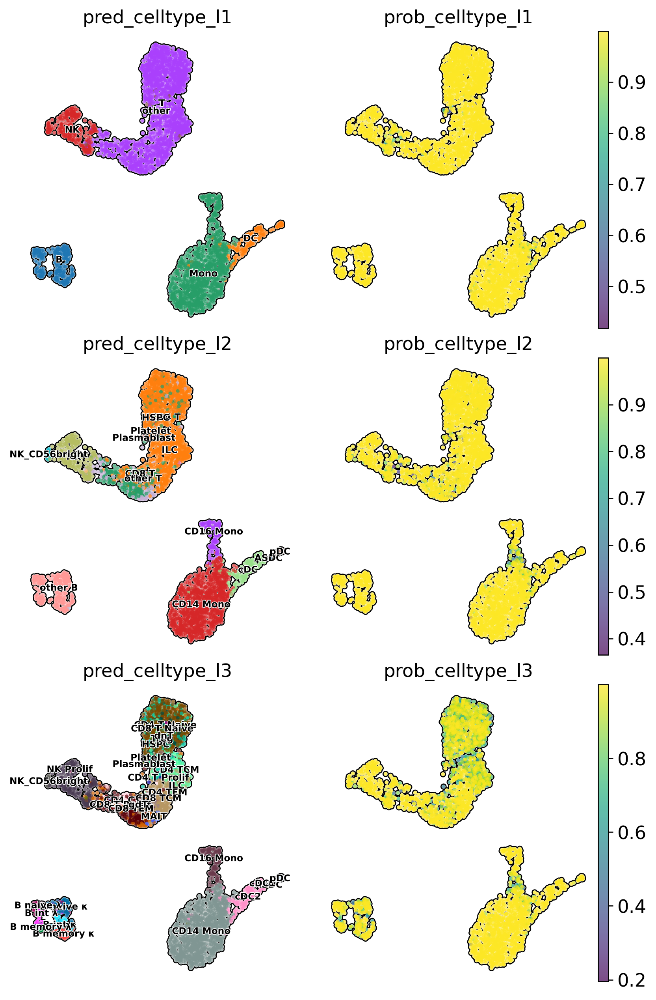

In [42]:
# Visualise predicted cell types levels and prediction probabilities
sc.pl.embedding(adata, 
                color = [
                    'pred_celltype_l1',
                    'prob_celltype_l1',
                    'pred_celltype_l2',
                    'prob_celltype_l2',
                    'pred_celltype_l3',
                    'prob_celltype_l3'
                ],
                basis = 'X_umap',
                frameon = False,
                add_outline = True,
                legend_loc = 'on data',
                legend_fontsize = 7,
                legend_fontoutline = 1,
                ncols = 2,
                wspace = 0, 
                hspace = 0.1)

## Check prediction results

In [45]:
marker_genes = {
    "CD4 T Naive" : ['CD4', 'TRABD2A', 'CCR7'],
    "CD4 TEM": ['CD4', "GZMK", 'CCL5'],
    "Treg": ['RTKN2', 'FOXP3', 'IL2RA'],
    "B memory": ['SSPN', 'IGHA2', 'AIM2'],
    "B naive": ['TCL1A', 'IGHD'],
    "NK": ["FCER1G", 'KLRF1'],
    "NK_CD56bright": ['GZMK', 'XCL1'],
    "CD14 Mono": ['CD14', 'LYZ'],
    "CD16 Mono": ['FCGR3A', 'MS4A7'],   
    "MAIT": ['CXCR6', 'SLC4A10', 'GZMK'],   
    "Platelet": ['PPBP', 'PF4', 'GP9'],
    "pDC": ['SCT', 'CLEC4C', 'IRF8']
}

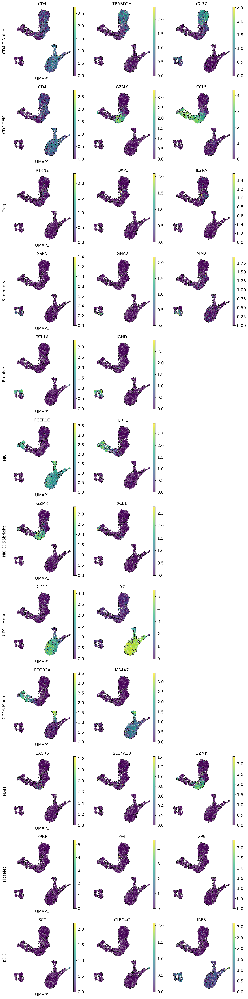

In [46]:
# Make Axes
# Number of needed rows and columns (based on the row with the most columns)
nrow = len(marker_genes)
ncol = max([len(vs) for vs in marker_genes.values()])
fig, axs = plt.subplots(nrow, ncol, figsize=(4 * ncol, 4 * nrow))
# Plot expression for every marker on the corresponding Axes object
for row_idx, (cell_type, markers) in enumerate(marker_genes.items()):
    col_idx = 0
    for marker in markers:
        ax = axs[row_idx, col_idx]
        sc.pl.umap(adata, color=marker, ax=ax, show=False, cmap='viridis', frameon=False, 
                   add_outline=True, ncols=3, s=20)
        # Add cell type as row label - here we simply add it as ylabel of
        # the first Axes object in the row
        if col_idx == 0:
            # We disabled axis drawing in UMAP to have plots without background and border
            # so we need to re-enable axis to plot the ylabel
            ax.axis("on")
            ax.tick_params(
                top="off",
                bottom="off",
                left="off",
                right="off",
                labelleft="on",
                labelbottom="off",
            )
            ax.set_ylabel(cell_type + "\n", rotation=90, fontsize=14)
            ax.set(frame_on=False)
        col_idx += 1
    # Remove unused column Axes in the current row
    while col_idx < ncol:
        axs[row_idx, col_idx].remove()
        col_idx += 1
# Alignment within the Figure
fig.tight_layout()

In [ ]:
# Save anndata with predicted annotations
adata.write_h5ad('adata_predicted.h5ad')

In [47]:
pip list

Package                       Version
----------------------------- --------------
absl-py                       2.1.0
adjustText                    1.2.0
aiohappyeyeballs              2.3.6
aiohttp                       3.10.3
aiosignal                     1.3.1
alabaster                     1.0.0
alembic                       1.13.2
anndata                       0.10.8
annoy                         1.17.3
anyio                         4.4.0
appdirs                       1.4.4
argon2-cffi                   23.1.0
argon2-cffi-bindings          21.2.0
array_api_compat              1.8
arrow                         1.3.0
asttokens                     2.4.1
async-lru                     2.0.4
attrs                         24.2.0
Babel                         2.14.0
beautifulsoup4                4.12.3
bleach                        6.1.0
bokeh                         3.4.2
branca                        0.7.2
Brotli                        1.1.0
cached-property               1.5.2
cachetools